In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import warnings
from pandas.errors import PerformanceWarning

# Inital setting for plot size
from matplotlib import rcParams
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

def get_top_genes(adata, n_genes=25 ):
    # Get the dictionary of ranked genes
    ranked_genes = adata.uns["rank_genes_groups"]['names']
    # Create a DataFrame to store the top genes for each cluster
    top_genes_df = pd.DataFrame({cluster: ranked_genes[cluster][:n_genes] 
                                 for cluster in ranked_genes.dtype.names})
    
    return top_genes_df


In [2]:
crc_celsius = sc.read('/mnt/backup/flamingo/userdata/crc/data/integrated_crc.h5ad')
crc_celsius.obs['sex'] = crc_celsius.obs['sex'].replace({22:'F',2:"F",1:'M'})

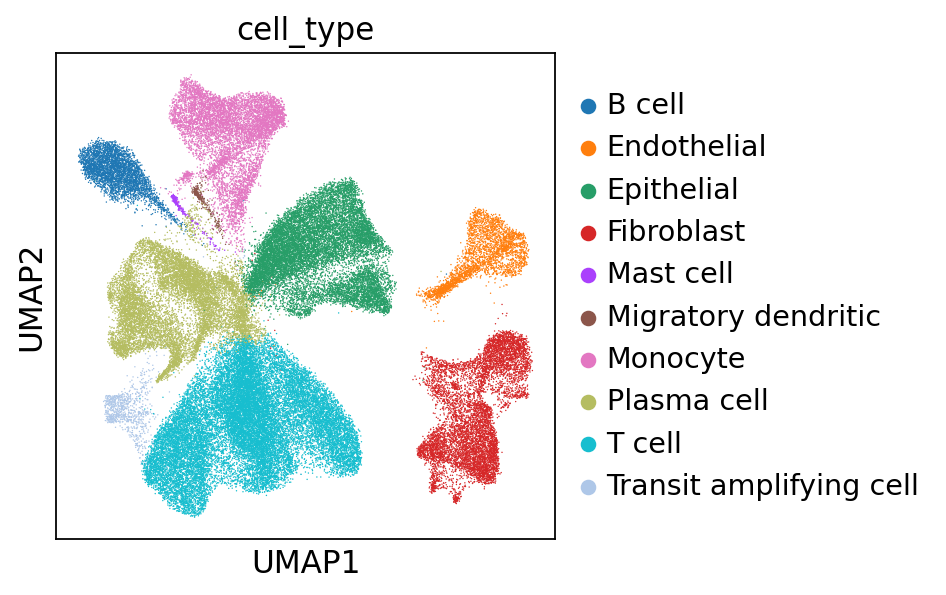

In [3]:
if 'cell_type_colors' in crc_celsius.uns:
    del crc_celsius.uns['cell_type_colors']

sc.pl.umap(crc_celsius, color='cell_type')

# T cells

T-cell subset shape: (24549, 6892)
T-cell subtypes: cell_type
T cell       24326
Mast cell      223
Name: count, dtype: int64
filtered out 1 genes that are detected in less than 1 cells
computing PCA
    with n_comps=50
    finished (0:01:54)


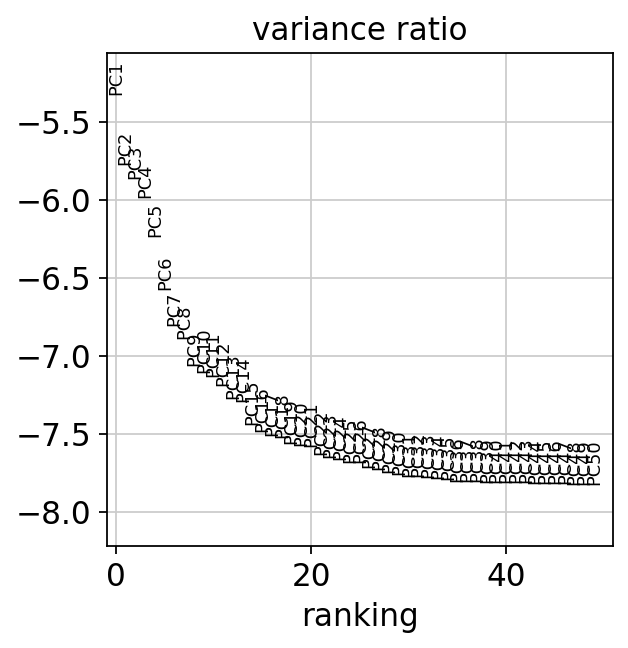

computing neighbors
    using 'X_pca' with n_pcs = 40


/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:28)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:11)
running Leiden clustering


/tmp/ipykernel_64015/2155616338.py:29: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(crc_tcells, resolution=res, key_added=f'leiden_res_{res}')


    finished: found 3 clusters and added
    'leiden_res_0.1', the cluster labels (adata.obs, categorical) (0:00:06)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.2', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_res_0.3', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.4', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res_0.5', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.6', the cluster labels (adata.obs, categorical) (0:00:15)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.8', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden cluste

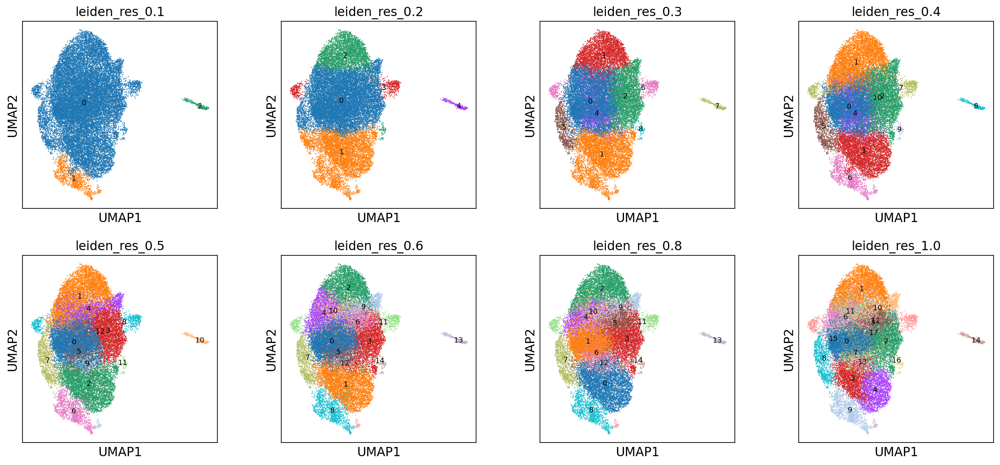

In [4]:
tcell_mask = crc_celsius.obs['cell_type'].str.contains('T cell', case=False, na=False)
crc_tcells = crc_celsius[tcell_mask, :].copy()

print(f"T-cell subset shape: {crc_tcells.shape}")
print(f"T-cell subtypes: {crc_tcells.obs['cell_type'].value_counts()}")

# Store the normalized data
crc_tcells.raw = crc_tcells

sc.pp.filter_genes(crc_tcells, min_cells=1)  # Remove genes not expressed in any cell
# Find highly variable genes within T-cells

# Scale data
sc.pp.scale(crc_tcells, max_value=10)

# Principal component analysis
sc.tl.pca(crc_tcells, svd_solver='arpack')
sc.pl.pca_variance_ratio(crc_tcells, log=True, n_pcs=50)

# Compute neighborhood graph
sc.pp.neighbors(crc_tcells, n_neighbors=10, n_pcs=40)

# Perform UMAP embedding
sc.tl.umap(crc_tcells)

# Leiden clustering with multiple resolutions
resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 1.0]
for res in resolutions:
    sc.tl.leiden(crc_tcells, resolution=res, key_added=f'leiden_res_{res}')

sc.pl.umap(crc_tcells, color=[f'leiden_res_{res}' for res in resolutions], legend_loc='on data', legend_fontsize=8, legend_fontweight='normal')



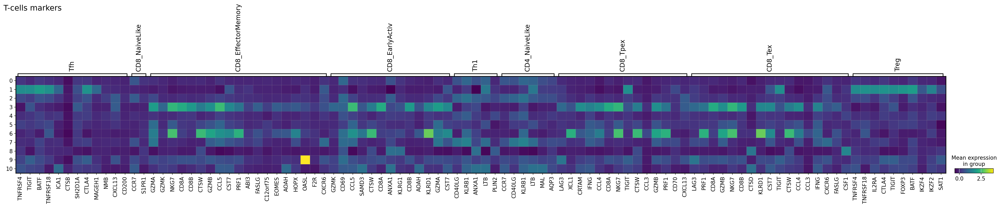

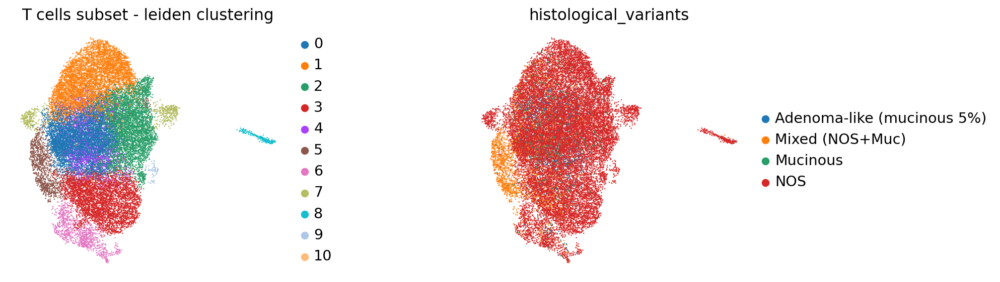

In [5]:
tcell_markers = pd.read_csv('/home/dimitris/Workspace/crc/data/references/tcells_markers.csv')
tcell_marker_dict = {
    column: tcell_markers[column].dropna().tolist() 
    for column in tcell_markers.columns
}

tcell_marker_dict_filtered = {
    key: [gene for gene in gene_list if gene in crc_tcells.var_names]
    for key, gene_list in tcell_marker_dict.items()
}
sc.pl.matrixplot(crc_tcells, tcell_marker_dict_filtered, groupby='leiden_res_0.4', log=False, show = False)
fig = plt.gcf()
fig.suptitle(
    'T-cells markers', 
    x=0.17,  # Left-aligned (0=left, 1=right)
    y=1.2,  # Near the top (0=bottom, 1=top)
    ha='left' , # Horizontal alignment
    va = 'top'
)

sc.pl.umap(
    crc_tcells, 
    color=["leiden_res_0.4", "histological_variants"],
    wspace=0.5,  # increase horizontal space between subplots
    frameon=False,
    title = "T cells subset - leiden clustering"
)

# Fibroblasts

T-cell subset shape: (8231, 6892)
T-cell subtypes: cell_type
Fibroblast    8231
Name: count, dtype: int64
filtered out 17 genes that are detected in less than 1 cells
computing PCA
    with n_comps=50
    finished (0:00:28)


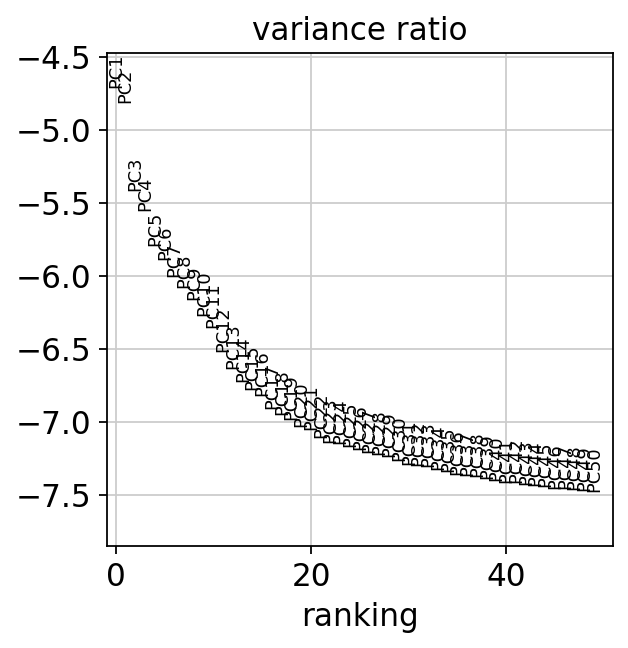

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.1', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_res_0.2', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_res_0.3', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_res_0.4', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 14 clusters and added
  

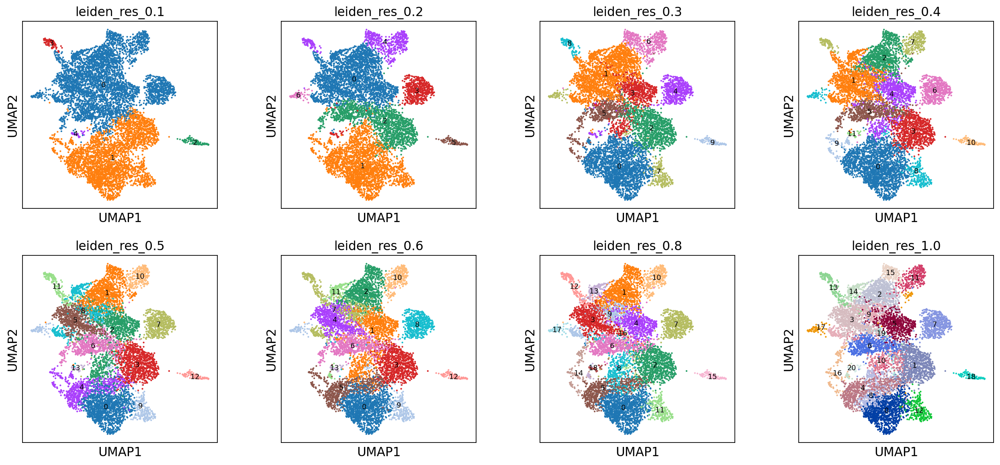

In [6]:
fibroblast_cell_mask = crc_celsius.obs['cell_type'].str.contains('Fibroblast', case=False, na=False)
crc_fibroblast_cells = crc_celsius[fibroblast_cell_mask, :].copy()

print(f"T-cell subset shape: {crc_fibroblast_cells.shape}")
print(f"T-cell subtypes: {crc_fibroblast_cells.obs['cell_type'].value_counts()}")

# Store the normalized data
crc_fibroblast_cells.raw = crc_fibroblast_cells

sc.pp.filter_genes(crc_fibroblast_cells, min_cells=1)  # Remove genes not expressed in any cell
# Find highly variable genes within T-cells

# Scale data
sc.pp.scale(crc_fibroblast_cells, max_value=10)

# Principal component analysis
sc.tl.pca(crc_fibroblast_cells, svd_solver='arpack')
sc.pl.pca_variance_ratio(crc_fibroblast_cells, log=True, n_pcs=50)

# Compute neighborhood graph
sc.pp.neighbors(crc_fibroblast_cells, n_neighbors=10, n_pcs=40)

# Perform UMAP embedding
sc.tl.umap(crc_fibroblast_cells)

# Leiden clustering with multiple resolutions
resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 1.0]
for res in resolutions:
    sc.tl.leiden(crc_fibroblast_cells, resolution=res, key_added=f'leiden_res_{res}')

sc.pl.umap(crc_fibroblast_cells, color=[f'leiden_res_{res}' for res in resolutions], legend_loc='on data', legend_fontsize=8, legend_fontweight='normal')

/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


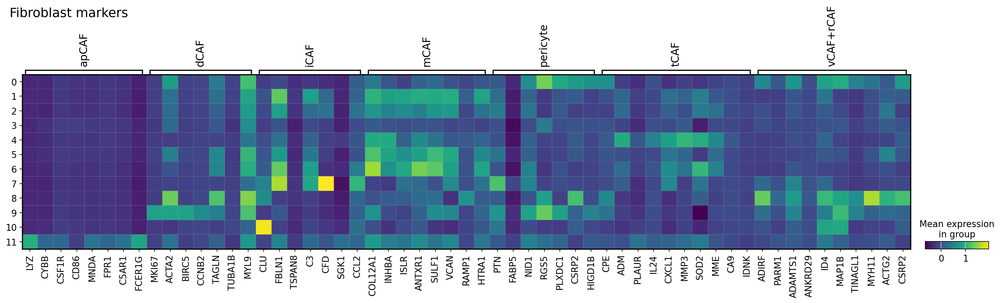

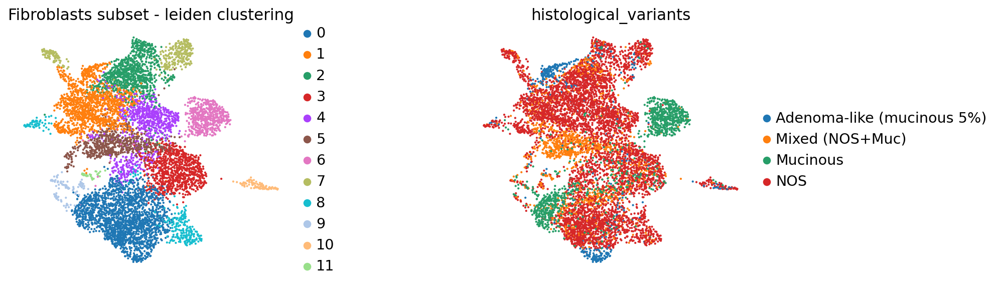

In [7]:
fibroblast_deg_results = pd.read_csv('/home/dimitris/Workspace/crc/data/references/fibroblasts_deg_results.csv')

# Filter significant genes (if needed)"
df_sig = fibroblast_deg_results[fibroblast_deg_results['p_val_adj'] < 0.05].copy()

# Compute negative log10 of adjusted p-value
df_sig['neg_log_pval_adj'] = -np.log10(df_sig['p_val_adj'])
df_sig['pct_diff'] = df_sig['pct.1'] - df_sig['pct.2']

# Sort by:
# 1. Cluster, 
# 2. -log10(p_val_adj) (descending: most significant first),
# 3. avg_log2FC (descending: highest fold-change first)
df_sorted = df_sig.sort_values(
    by=['pct_diff', 'avg_log2FC', 'neg_log_pval_adj'],
    ascending=[False,False, False]
)

# Extract top 10 genes per cluster into a dictionary
top_genes_dict = (
    df_sorted.groupby('cluster')['gene']
    .apply(lambda x: x.head(10).tolist())
    .to_dict()
)


top_fibroblast_genes_dict_filtered = {
    key: [gene for gene in gene_list if gene in crc_fibroblast_cells.var_names]
    for key, gene_list in top_genes_dict.items()
}

del top_fibroblast_genes_dict_filtered['other']
sc.pl.matrixplot(crc_fibroblast_cells, top_fibroblast_genes_dict_filtered, groupby='leiden_res_0.4', log=True,show = False)
# Access the figure and adjust title
fig = plt.gcf()
fig.suptitle(
    'Fibroblast markers', 
    x=0.17,  # Left-aligned (0=left, 1=right)
    y=1.,  # Near the top (0=bottom, 1=top)
    ha='left' , # Horizontal alignment
    va = 'top'
)

plt.show()
sc.pl.umap(
    crc_fibroblast_cells, 
    color=["leiden_res_0.4", "histological_variants"],
    wspace=0.5,  # increase horizontal space between subplots
    frameon=False,
    title = "Fibroblasts subset - leiden clustering"
)

# B cells

T-cell subset shape: (3698, 6892)
T-cell subtypes: cell_type
B cell    3698
Name: count, dtype: int64
filtered out 93 genes that are detected in less than 1 cells
computing PCA
    with n_comps=50
    finished (0:00:18)


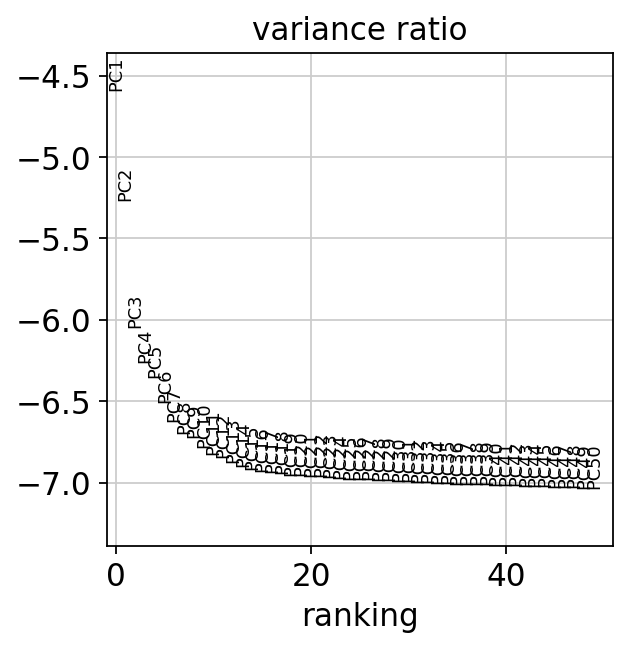

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:03)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden_res_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.3', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    '

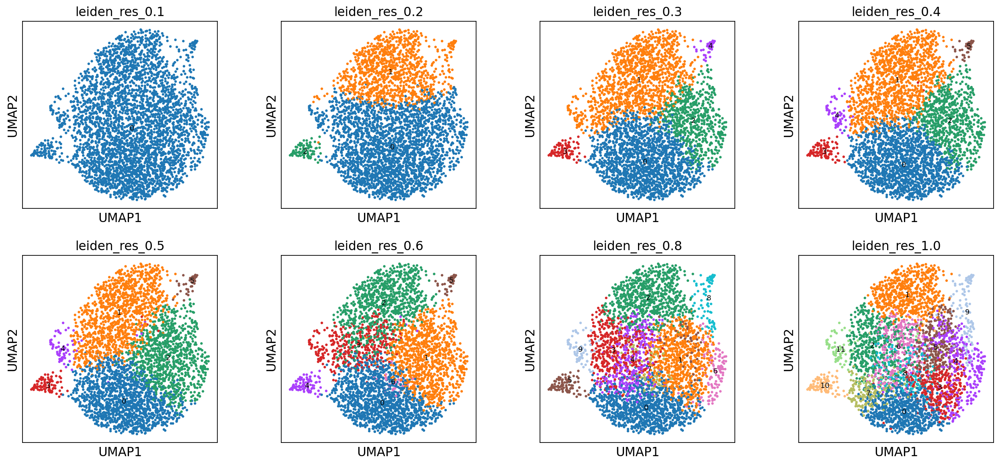

In [8]:
bcell_mask = crc_celsius.obs['cell_type'].str.contains('B cell', case=False, na=False)
crc_bcell_cells = crc_celsius[bcell_mask, :].copy()

print(f"T-cell subset shape: {crc_bcell_cells.shape}")
print(f"T-cell subtypes: {crc_bcell_cells.obs['cell_type'].value_counts()}")

# Store the normalized data
crc_bcell_cells.raw = crc_bcell_cells

sc.pp.filter_genes(crc_bcell_cells, min_cells=1)  # Remove genes not expressed in any cell
# Find highly variable genes within T-cells

# Scale data
sc.pp.scale(crc_bcell_cells, max_value=10)

# Principal component analysis
sc.tl.pca(crc_bcell_cells, svd_solver='arpack')
sc.pl.pca_variance_ratio(crc_bcell_cells, log=True, n_pcs=50)

# Compute neighborhood graph
sc.pp.neighbors(crc_bcell_cells, n_neighbors=10, n_pcs=40)

# Perform UMAP embedding
sc.tl.umap(crc_bcell_cells)

# Leiden clustering with multiple resolutions
resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 1.0]
for res in resolutions:
    sc.tl.leiden(crc_bcell_cells, resolution=res, key_added=f'leiden_res_{res}')

sc.pl.umap(crc_bcell_cells, color=[f'leiden_res_{res}' for res in resolutions], legend_loc='on data', legend_fontsize=8, legend_fontweight='normal')


/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


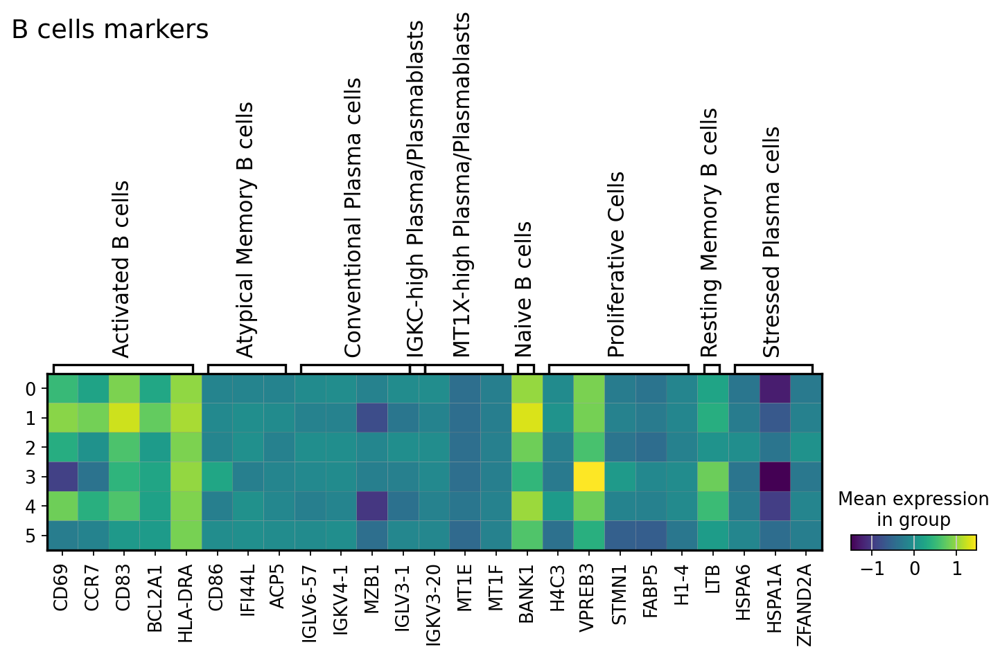

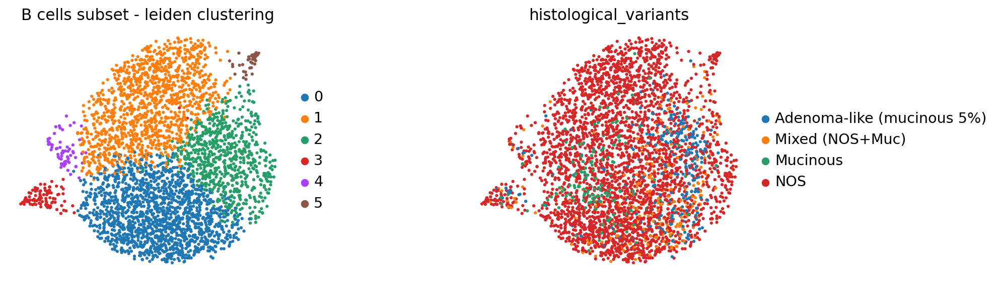

In [9]:
bcells_deg_results = pd.read_csv('/home/dimitris/Workspace/crc/data/references/b_cells_deg.csv')

df_sig = bcells_deg_results[bcells_deg_results['p_val_adj'] < 0.05].copy()

df_sig['neg_log_pval_adj'] = -np.log10(df_sig['p_val_adj'])
df_sig['pct_diff'] = df_sig['pct.1'] - df_sig['pct.2']

df_sorted = df_sig.sort_values(
    by=[ 'avg_log2FC', 'neg_log_pval_adj'],
    ascending=[False, False]
)

top_genes_dict = (
    df_sorted.groupby('cluster')['gene']
    .apply(lambda x: x.head(20).tolist())
    .to_dict()
)

top_bcell_genes_dict_filtered = {
    key: [gene for gene in gene_list if gene in crc_bcell_cells.var_names]
    for key, gene_list in top_genes_dict.items()
}

# del top_bcell_genes_dict_filtered['Conventional Plasma cells']
# del top_bcell_genes_dict_filtered['MT1X-high Plasma/Plasmablasts']
# del top_bcell_genes_dict_filtered['Stressed Plasma cells']
# del top_bcell_genes_dict_filtered['IGKC-high Plasma/Plasmablasts']
# del top_bcell_genes_dict_filtered['Proliferative Cells']
del top_bcell_genes_dict_filtered['GC B cells']

top_bcell_genes_dict_filtered
sc.pl.matrixplot(crc_bcell_cells, top_bcell_genes_dict_filtered, groupby='leiden_res_0.4', log = True,show = False)

# Access the figure and adjust title
fig = plt.gcf()
fig.suptitle(
    'B cells markers', 
    x=0.15,  # Left-aligned (0=left, 1=right)
    y=1.7,  # Near the top (0=bottom, 1=top)
    ha='left' , # Horizontal alignment
    va = 'top'
)

plt.show()
sc.pl.umap(
    crc_bcell_cells, 
    color=["leiden_res_0.4", "histological_variants"],
    wspace=0.5,  # increase horizontal space between subplots
    frameon=False,
    title = "B cells subset - leiden clustering"
)

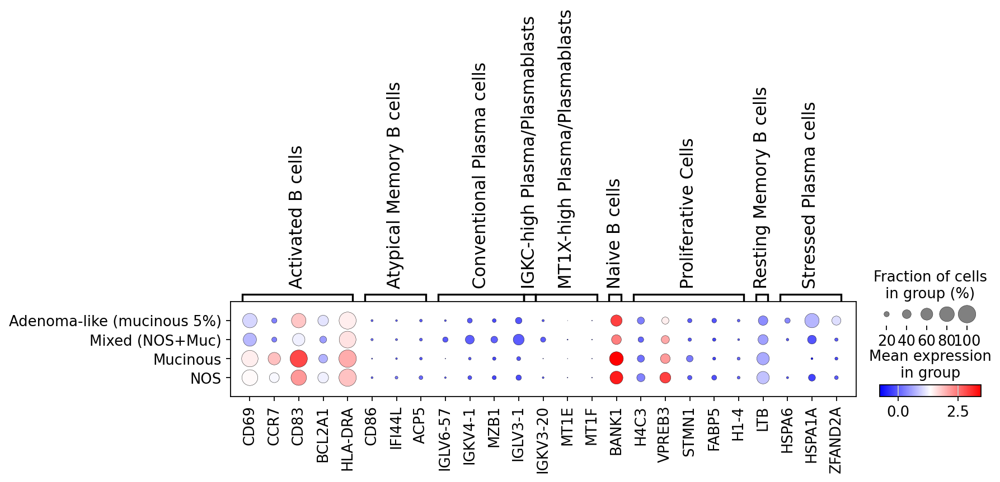

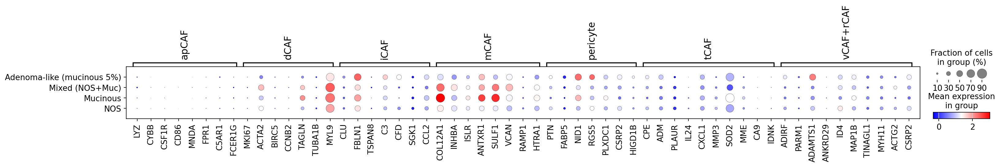

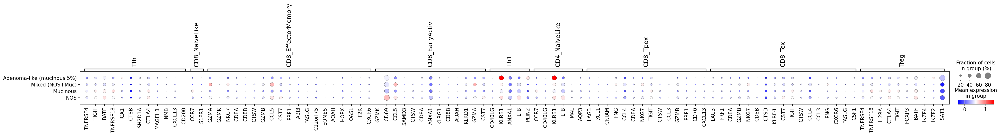

In [11]:
sc.pl.dotplot(crc_bcell_cells, top_bcell_genes_dict_filtered, groupby="histological_variants",  cmap="bwr")
sc.pl.dotplot(crc_fibroblast_cells, top_fibroblast_genes_dict_filtered, groupby="histological_variants",  cmap="bwr")
sc.pl.dotplot(crc_tcells, tcell_marker_dict_filtered, groupby="histological_variants",  cmap="bwr")

In [13]:
def freq_(x,a):
    return round((x*100)/a,2)

def stacked_barplot(ax,metadata,title):
    cell_counts = metadata.groupby(["cell_type"]).apply(len)
    freqs = cell_counts.apply(freq_,a= sum(cell_counts))
    bottom = np.zeros(1)
    width = 1
    for type_, freq in freqs.items():
        p = ax.bar('freqs',freq, width=0.1, label=type_, bottom=bottom)
        bottom += freq
   
    ax.set_title(title,fontsize= 10, y=0.95,  loc='center', va='baseline')
 
    return ax, freqs

crc_bcell_cells.obs.columns

Index(['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'log_nCount_RNA',
       'percent_mt', 'pcmito_inrange', 'percent_rb', 'pcribo_inrange',
       'percent_st', 'min_features', 'min_counts', 'timepoint',
       'site_of_biopsy', 'collection_method', 'tumor_type', 'patient_id',
       'cohort', 'age', 'sex', 'bmi', 'comorbidities', 'cancer_family_history',
       'clinical_trials', 'date_of_diagnosis', 'histological_type',
       'histological_variants', 'grade_of_differentiation', 'tumor_size',
       'tumor_location', 'metastatic_diagnosis', 'location_of_metastasis',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden',
       'cell_type', 'leiden_res_0.1', 'leiden_res_0.2', 'leiden_

In [ ]:
 
fig, axs = plt.subplots(1, 5, figsize=(10, 10))
axs[0],_ = stacked_barplot(axs[0],crc_bcell_cells.obs,"total")
axs[0].axis('off')

for i, variant in enumerate(['Mucinous','Adenoma-like (mucinous 5%)','Mixed (NOS+Muc)','NOS']):
    sub = adata.obs[adata.obs['histological_variants'] == variant]
    variant = 'mucinous 5%' if variant == 'Adenoma-like (mucinous 5%)' else variant
    axs[i +1], freqs = stacked_barplot(axs[i+1],sub,variant)
    axs[i +1].axis('off')
    
order = crc_bcell_cells.
handles, labels = plt.gca().get_legend_handles_labels()
ordered_handles = [handles[labels.index(item)] for item in order]
ordered_labels = [item for item in order]
plt.legend(ordered_handles, ordered_labels,bbox_to_anchor=(1.05, 1.0))    
plt.grid(False)
plt.axis('off')                    
plt.tight_layout()
plt.show()

In [2]:
immune = sc.read('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas.h5ad')

In [22]:
target_cells = 1000
cluster_key = "Cell_category"

grouped = immune.obs.groupby(cluster_key)
downsampled_indices = []

for _, group in grouped:
    if len(group) > target_cells:
        downsampled_indices.extend(group.sample(target_cells).index)
    else:
        downsampled_indices.extend(group.index)

immune_downsampled = immune[downsampled_indices]

/tmp/ipykernel_102493/4235567381.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = immune.obs.groupby(cluster_key)


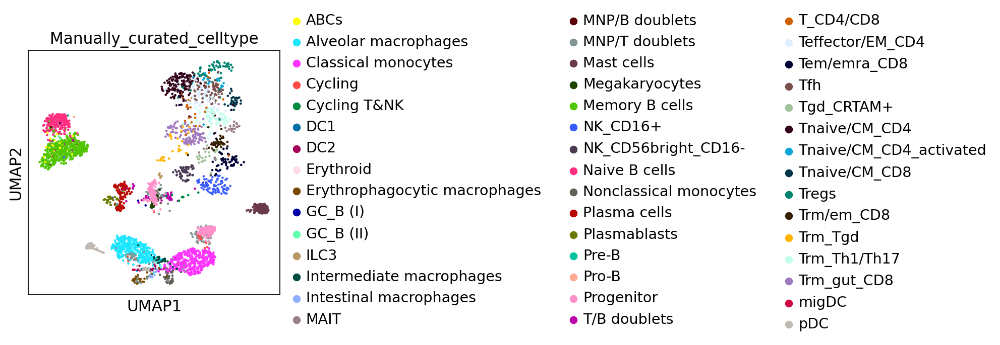

In [23]:
sc.pl.umap(immune_downsampled,color=[
      # "Cell_category",
      # "Predicted_labels_CellTypist",
      # "Majority_voting_CellTypist",
      # "Majority_voting_CellTypist_high",
      "Manually_curated_celltype"
                                    ]
                         )

In [16]:
immune

AnnData object with n_obs × n_vars = 329762 × 36601
    obs: 'Organ', 'Donor', 'Chemistry', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'Manually_curated_celltype'
    uns: 'Cell_category_colors', 'Predicted_labels_CellTypist_colors', 'Majority_voting_CellTypist_colors', 'Majority_voting_CellTypist_high_colors', 'Manually_curated_celltype_colors'
    obsm: 'X_umap'

In [26]:
from scipy import io

io.mmwrite('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_matrix.mtx', immune_downsampled.X)
pd.DataFrame(immune_downsampled.obs).to_csv('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_metadata.csv')
pd.DataFrame(immune_downsampled.var).to_csv('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_features.csv')
# Save UMAP coordinates
if 'X_umap' in immune_downsampled.obsm:
    umap_df = pd.DataFrame(immune_downsampled.obsm['X_umap'], index=immune_downsampled.obs_names)
    umap_df.columns = [f'UMAP_{i+1}' for i in range(umap_df.shape[1])]
    umap_df.to_csv('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_umap_coordinates.csv')
    
    # Also save the UMAP model parameters if available
    if 'umap' in immune_downsampled.uns:
        with open('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_umap_params.json', 'w') as f:
            json.dump(immune_downsampled.uns['umap'], f)

# Save PCA if available
if 'X_pca' in immune_downsampled.obsm:
    pca_df = pd.DataFrame(immune_downsampled.obsm['X_pca'], index=immune_downsampled.obs_names)
    pca_df.columns = [f'PC_{i+1}' for i in range(pca_df.shape[1])]
    pca_df.to_csv('/mnt/backup/Workspace/crc/data/CrossTissueImmuneCellAtlas_pca_coordinates.csv')

In [27]:
immune_downsampled.var

""
MIR1302-2HG
FAM138A
OR4F5
AL627309.1
AL627309.3
...
AC141272.1
AC023491.2
AC007325.1
AC007325.4
